### Horses to Zebras.

Based on the previous notebook, Our model did not perform well, so in this notebook we are going to have a look on what we can do to improve the model perfomance. Again we are going to make few modifications using the `UpSampling2D` + `Conv2D` instead of the `Conv2DTrasnpose()` layer.

### Imports

In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras

import os, time
import matplotlib.pyplot as plt
import numpy as np

from prettytable import PrettyTable

AUTOTUNE = tf.data.AUTOTUNE

tf.__version__

'2.5.0'

### Input pipeline

We are going to preprocess our input by doing the following:

* random jittering, the image is resized to `286 x 286` and then randomly cropped to `256 x 256`.
* random mirroring, the image is randomly flipped horizontally i.e left to right.
* We are going to normalize the image so that each pixel value will be in range `[-1, 1]`.

In [2]:
dataset, metadata = tfds.load(
    'cycle_gan/horse2zebra',
    with_info=True,
    as_supervised=True
)

train_horses, train_zebras = dataset['trainA'], dataset['trainB']
test_horses, test_zebras = dataset['testA'], dataset['testB']

Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/horse2zebra/2.0.0.incompleteGMN8HM/cycle_gan-trainA.tfrecord


Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/horse2zebra/2.0.0.incompleteGMN8HM/cycle_gan-trainB.tfrecord


Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/horse2zebra/2.0.0.incompleteGMN8HM/cycle_gan-testA.tfrecord


Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/horse2zebra/2.0.0.incompleteGMN8HM/cycle_gan-testB.tfrecord


Dataset cycle_gan downloaded and prepared to /root/tensorflow_datasets/cycle_gan/horse2zebra/2.0.0. Subsequent calls will reuse this data.


### Hyper parameters

In [3]:
BUFFER_SIZE = 1000
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

### Random cropping

In [4]:
def random_crop(image):
  cropped_image = tf.image.random_crop(
      image, size=[IMG_HEIGHT, IMG_WIDTH, 3]
  )
  return cropped_image

### Normalizing images

In [5]:
def normalize(image):
  image = tf.cast(image, tf.float32)
  image = (image / 127.5) - 1
  return image

### Random `jittering`

In [6]:

@tf.function
def random_jitter(image):
  image = tf.image.resize(image,[286, 286],
                          method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
                          )
  image = random_crop(image)
  image = tf.image.random_flip_left_right(image)
  return image

Creating functions that will load the train and test sets. 

**Note:** Only random jittering is applied on the train set only not on the test set. On the test set we are only going to nomilize the images.

In [7]:
def process_image_train(image, label):
  image = random_jitter(image)
  image = normalize(image)
  return image

def process_image_test(image, label):
  return normalize(image)

### Datasets.

In [8]:
train_horses = train_horses.cache().map(
    process_image_train, num_parallel_calls=AUTOTUNE
).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

train_zebras = train_zebras.cache().map(
    process_image_train, num_parallel_calls=AUTOTUNE
).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

test_horses = test_horses.cache().map(
    process_image_test, num_parallel_calls=AUTOTUNE
).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

test_zebras = test_zebras.cache().map(
    process_image_test, num_parallel_calls=AUTOTUNE
).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

### Counting examples and tabulate them.

In [9]:
colums_data = "SUBSET", "EXAMPLE(s)"
rows_data = [
             ["training(horses)", f'{len(train_horses):,}'], 
             ["training(zebras)", f'{len(train_zebras):,}'],
             ["testing(horses)", f'{len(test_horses):,}'], 
             ["testing(zebras)", f'{len(test_zebras):,}'],
  ]
title = "TOTAL EXAMPLES FOR ALL SUBSETS"
def tabulate_example(column_names, data, title):
  table = PrettyTable(column_names)
  table.title= title
  table.align[column_names[0]] = 'l'
  table.align[column_names[1]] = 'r'
  for row in data:
    table.add_row(row)
  print(table)
tabulate_example(colums_data, rows_data, title)

+---------------------------------+
|  TOTAL EXAMPLES FOR ALL SUBSETS |
+-------------------+-------------+
| SUBSET            |  EXAMPLE(s) |
+-------------------+-------------+
| training(horses)  |       1,067 |
| training(zebras)  |       1,334 |
| testing(horses)   |         120 |
| testing(zebras)   |         140 |
+-------------------+-------------+


In [14]:
sample_horse = next(iter(train_horses))
sample_zebra = next(iter(train_zebras))

### Plotting images

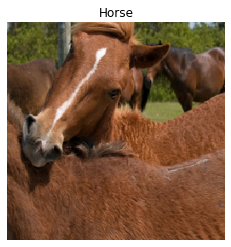

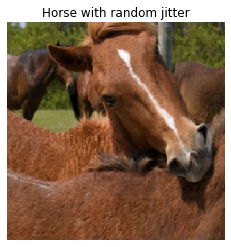

In [15]:
plt.imshow(sample_horse[0] * 0.5 + 0.5, cmap="gray")
plt.title("Horse")
plt.axis('off')
plt.show()

plt.imshow(random_jitter(sample_horse[0]) * 0.5 + 0.5, cmap="gray")
plt.title("Horse with random jitter")
plt.axis('off')
plt.show()

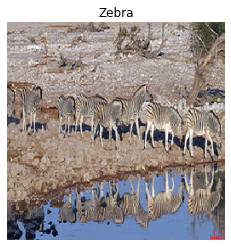

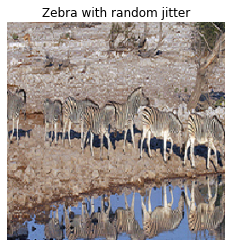

In [16]:
plt.imshow(sample_zebra[0] * 0.5 + 0.5, cmap="gray")
plt.title("Zebra")
plt.axis('off')
plt.show()

plt.imshow(random_jitter(sample_zebra[0]) * 0.5 + 0.5, cmap="gray")
plt.title("Zebra with random jitter")
plt.axis('off')
plt.show()

### Instace Normalization.
First we will create an ``InstanceNormalization``Layer from this [paper](https://arxiv.org/abs/1607.08022).

In [17]:
class InstanceNormalization(keras.layers.Layer):
  def __init__(self, epsilon=1e-5):
    super(InstanceNormalization, self).__init__()
    self.epsilon = epsilon

  def build(self, input_shape):
    self.scale = self.add_weight(
        name='scale',
        shape=input_shape[-1:],
        initializer=tf.random_normal_initializer(1., 0.02),
        trainable=True)

    self.offset = self.add_weight(
        name='offset',
        shape=input_shape[-1:],
        initializer='zeros',
        trainable=True)

  def call(self, x):
    mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
    inv = tf.math.rsqrt(variance + self.epsilon)
    normalized = (x - mean) * inv
    return self.scale * normalized + self.offset


### Encoder, (Downsampler)

* This time we are going to use function insead of subclassing, we are aslo going to return a keras Sequential model instead of a keras Layer.

```py
[ Conv2D ] => [ Batchnorm ] => [ LeakyRelu ]
```

Args:

```
  Args:
    filters: number of filters
    size: filter size
    norm_type: Normalization type; either 'batchnorm' or 'instancenorm'.
    apply_norm: If True, adds the batchnorm layer
```

Return:
```
Downsample keras Sequential model
```

In [18]:
def downsample(filters, size, norm_type='batchnorm', apply_norm=True):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_norm:
    if norm_type.lower() == 'batchnorm':
      result.add(tf.keras.layers.BatchNormalization())
    elif norm_type.lower() == 'instancenorm':
      result.add(InstanceNormalization())

  result.add(tf.keras.layers.LeakyReLU())
  return result

### Testing the Encoder layer.

In [19]:
down_model = downsample(3, 4)
down_sampled_horse = down_model(sample_horse)
down_sampled_horse.shape

TensorShape([1, 128, 128, 3])

### Decoder (Upsampler).
 * This time we are going to use function insead of subclassing, we are aslo going to return a keras Sequential model instead of a keras Layer. Note that in this notebook we are going to use the `UpSampling2D` instead of `Conv2DTranspose` layer.

#### What is the difference between the `UpSampling2D()` and the `Conv2DTranspose()` layers?

> ``UpSampling2D`` is just a simple scaling up of the image by using nearest neighbour or bilinear upsampling, so nothing smart. Advantage is it's cheap.``Conv2DTranspose`` is a convolution operation whose kernel is learnt (just like normal conv2d operation) while training your model. Using ``Conv2DTranspose`` will also upsample its input but the key difference is the model should learn what is the best upsampling for the job. [ref](https://stackoverflow.com/questions/53654310/what-is-the-difference-between-upsampling2d-and-conv2dtranspose-functions-in-ker)


### `Decoder`

```
[ UpSamplerLayer ] => [ Batchnorm ] => [ Dropout ] => [ ReLu ]
```

Args:
```
  Args:
    filters: number of filters
    size: filter size
    norm_type: Normalization type; either 'batchnorm' or 'instancenorm'.
    apply_dropout: If True, adds the dropout layer
```

Returns:
```
Returns:
    Upsample Keras Sequential Model.
```



In [20]:
def upsample(filters, size, norm_type='batchnorm', apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=1,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))
  result.add(tf.keras.layers.UpSampling2D(size=(2, 2)))

  if norm_type.lower() == 'batchnorm':
    result.add(tf.keras.layers.BatchNormalization())
  elif norm_type.lower() == 'instancenorm':
    result.add(InstanceNormalization())

  if apply_dropout:
    result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())
  return result

### Testing the decoder layer.

In [21]:
up_model = upsample(3, 4)
up_sampled_horse = up_model(down_sampled_horse)
up_sampled_horse.shape

TensorShape([1, 256, 256, 3])

### The ``discriminator`` model.

We are going to us the [PatchGan](https://arxiv.org/abs/1611.07004) discriminator. which take the following args:

```
Args:
    norm_type: Type of normalization. Either 'batchnorm' or 'instancenorm'.
    target: Bool, indicating whether target image is an input or not.
```
and returns:

```
Returns:
  Discriminator model
```


In [22]:
def discriminator(norm_type='batchnorm', target=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[None, None, 3], name='input_image')
  x = inp

  if target:
    tar = tf.keras.layers.Input(shape=[None, None, 3], name='target_image')
    x = tf.keras.layers.concatenate([inp, tar])  # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, norm_type, False)(x)  # (bs, 128, 128, 64)
  down2 = downsample(128, 4, norm_type)(down1)  # (bs, 64, 64, 128)
  down3 = downsample(256, 4, norm_type)(down2)  # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(
      512, 4, strides=1, kernel_initializer=initializer,
      use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)

  if norm_type.lower() == 'batchnorm':
    norm1 = tf.keras.layers.BatchNormalization()(conv)
  elif norm_type.lower() == 'instancenorm':
    norm1 = InstanceNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(norm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(
      1, 4, strides=1,
      kernel_initializer=initializer)(zero_pad2)  # (bs, 30, 30, 1)

  if target:
    return tf.keras.Model(inputs=[inp, tar], outputs=last)
  else:
    return tf.keras.Model(inputs=inp, outputs=last)


In [23]:
discriminator().summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(None, None, None,  0                                            
__________________________________________________________________________________________________
target_image (InputLayer)       [(None, None, None,  0                                            
__________________________________________________________________________________________________
concatenate (Concatenate)       (None, None, None, 6 0           input_image[0][0]                
                                                                 target_image[0][0]               
__________________________________________________________________________________________________
sequential_2 (Sequential)       (None, None, None, 6 6144        concatenate[0][0]            

### Plotiing the discriminator model.

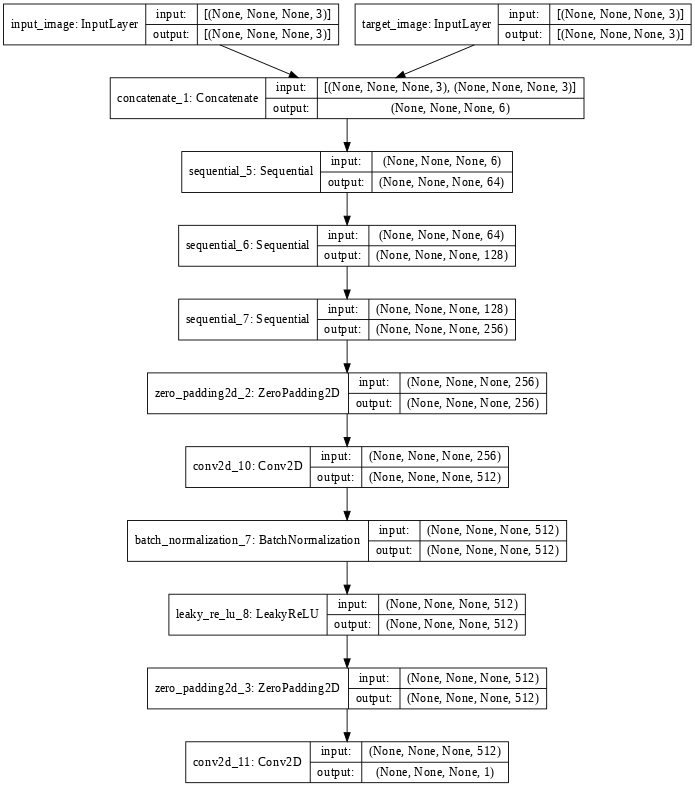

In [24]:
keras.utils.plot_model(discriminator(), show_shapes=True, dpi=64)

### The ``generator`` model.

We are going to build a `unet_generator` based on [this paper](https://arxiv.org/abs/1611.07004) which takes the following args.

Args:
```
Args:
  output_channels: Output channels
  norm_type: Type of normalization. Either 'batchnorm' or 'instancenorm'.
```

Return:
```
  Returns:
    Generator model
```

This generator model is absolutely the same as the one we used in the `pix2pix` series only few changes made.

**Changes to:** creating an instance of `concat` layer outside the skip connection loop

```py
concat = keras.layers.Concatenate()

....

for i, (up, skip) in enumerate(zip(up_stack, skips)):
    x = up(x)
    x = concat([x, skip])
```

**from:** creating an instance of `concat` layer inside the skip connection loop.

```py
for i, (up, skip) in enumerate(zip(up_stack, skips)):
    x = up(x)
    x = keras.layers.Concatenate()([x, skip])
```

In [25]:
def unet_generator(output_channels, norm_type='batchnorm'):
  down_stack = [
      downsample(64, 4, norm_type, apply_norm=False),  # (bs, 128, 128, 64)
      downsample(128, 4, norm_type),  # (bs, 64, 64, 128)
      downsample(256, 4, norm_type),  # (bs, 32, 32, 256)
      downsample(512, 4, norm_type),  # (bs, 16, 16, 512)
      downsample(512, 4, norm_type),  # (bs, 8, 8, 512)
      downsample(512, 4, norm_type),  # (bs, 4, 4, 512)
      downsample(512, 4, norm_type),  # (bs, 2, 2, 512)
      downsample(512, 4, norm_type),  # (bs, 1, 1, 512)
  ]

  up_stack = [
      upsample(512, 4, norm_type, apply_dropout=True),  # (bs, 2, 2, 1024)
      upsample(512, 4, norm_type, apply_dropout=True),  # (bs, 4, 4, 1024)
      upsample(512, 4, norm_type, apply_dropout=True),  # (bs, 8, 8, 1024)
      upsample(512, 4, norm_type),  # (bs, 16, 16, 1024)
      upsample(256, 4, norm_type),  # (bs, 32, 32, 512)
      upsample(128, 4, norm_type),  # (bs, 64, 64, 256)
      upsample(64, 4, norm_type),  # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(
      output_channels, 4, strides=2,
      padding='same', kernel_initializer=initializer,
      activation='tanh')  # (bs, 256, 256, 3)

  concat = tf.keras.layers.Concatenate()

  inputs = tf.keras.layers.Input(shape=[None, None, 3])
  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = concat([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

unet_generator(3).summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
sequential_8 (Sequential)       (None, None, None, 6 3072        input_1[0][0]                    
__________________________________________________________________________________________________
sequential_9 (Sequential)       (None, None, None, 1 131584      sequential_8[0][0]               
__________________________________________________________________________________________________
sequential_10 (Sequential)      (None, None, None, 2 525312      sequential_9[0][0]               
____________________________________________________________________________________________

### Plotting the model.


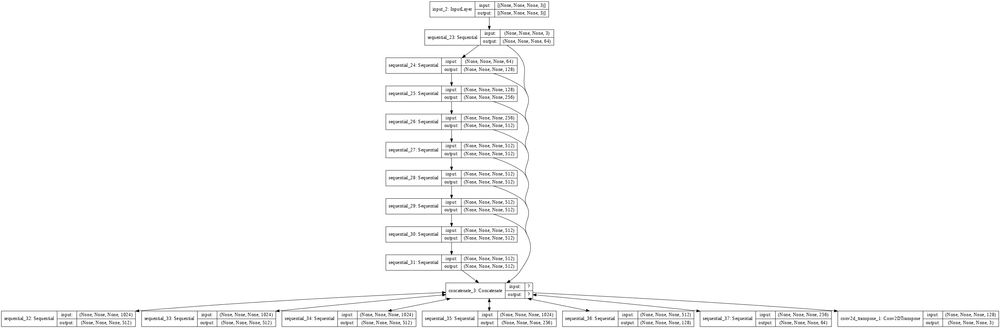

In [26]:
keras.utils.plot_model(unet_generator(3), show_shapes=True, dpi=64)

#### Initializing generators and discriminators.

In [27]:
OUTPUT_CHANNELS = 3

generator_g = unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = discriminator(norm_type='instancenorm', target=False)
discriminator_y = discriminator(norm_type='instancenorm', target=False)

In [28]:
generator_f.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
sequential_53 (Sequential)      (None, None, None, 6 3072        input_4[0][0]                    
__________________________________________________________________________________________________
sequential_54 (Sequential)      (None, None, None, 1 131328      sequential_53[0][0]              
__________________________________________________________________________________________________
sequential_55 (Sequential)      (None, None, None, 2 524800      sequential_54[0][0]              
____________________________________________________________________________________________

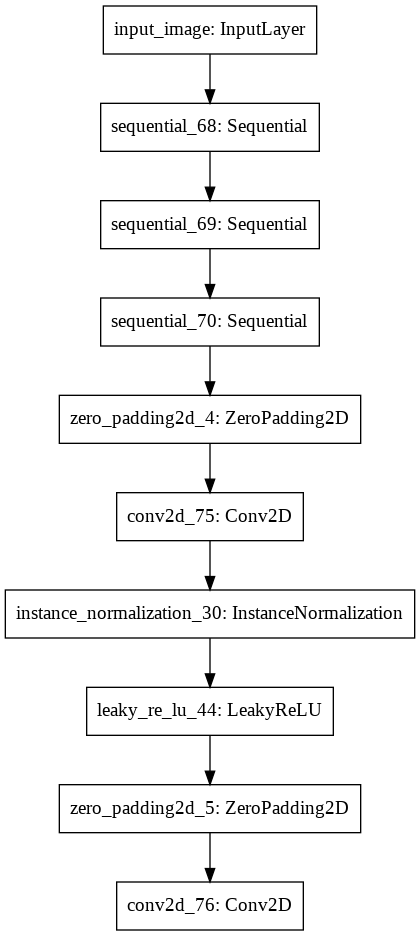

In [29]:
tf.keras.utils.plot_model(discriminator_x)

### Testing the generator.


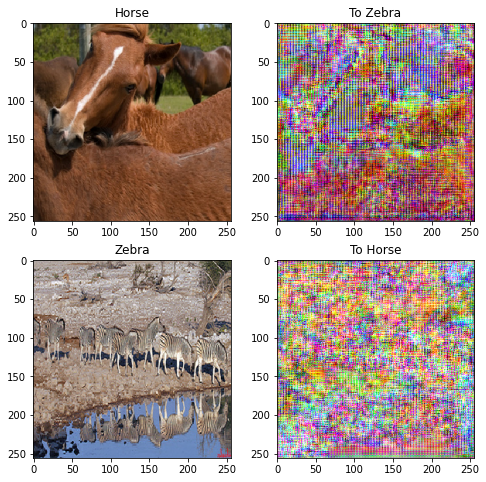

In [30]:
to_zebra = generator_g(sample_horse)
to_horse = generator_f(sample_zebra)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_horse, to_zebra, sample_zebra, to_horse]
title = ['Horse', 'To Zebra', 'Zebra', 'To Horse']

for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5)
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()

### Testing the discriminator.

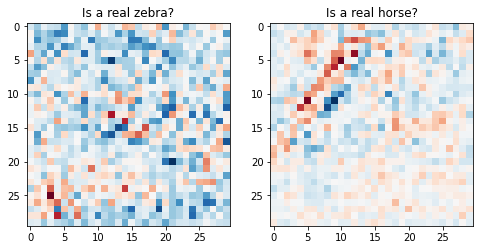

In [31]:
plt.figure(figsize=(8, 8))

plt.subplot(121)
plt.title('Is a real zebra?')
plt.imshow(discriminator_y(sample_zebra)[0, ..., -1], cmap='RdBu_r')

plt.subplot(122)
plt.title('Is a real horse?')
plt.imshow(discriminator_x(sample_horse)[0, ..., -1], cmap='RdBu_r')

plt.show()

### Loss functions

In [32]:
LAMBDA = 10
criterion = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real, generated):
  real_loss = criterion(tf.ones_like(real), real)
  generated_loss = criterion(tf.zeros_like(generated), generated)
  total_disc_loss = real_loss + generated_loss
  return total_disc_loss * .5

def generator_loss(generated):
  return criterion(tf.ones_like(generated), generated)

### calc_cycle_loss


In [33]:
def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
  return LAMBDA * loss1

### Identity loss

In [34]:
def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * .5 * loss

### Optimizers

In [35]:
generator_g_optimizer = generator_f_optimizer = tf.keras.optimizers.Adam(
    2e-4, beta_1 = .5
)

discriminator_x_optimizer = discriminator_y_optimizer = tf.keras.optimizers.Adam(
    2e-4, beta_1 = .5
)

### Checkpoints

In [36]:
checkpoint_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

### Training.

In this notebook we will train for fewer epochs to see if it works. You are free to go ahead and train for more epochs.

In [39]:
EPOCHS = 10

In [40]:
def generated_images(model, test_input):
  prediction = model(test_input)
  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']
  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

### `train_step`

In [41]:
@tf.function
def train_step(real_x, real_y):
  """
  persistent is set to True because the tape is used more than once to calculate the gradients.
  """
  with tf.GradientTape(persistent=True) as tape:
    """
    Generator G translates X -> Y
    Generator F translates Y -> X.
    """
    fake_y = generator_g(real_x, training=True)
    cycled_y = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_x = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    """
    calculate the losses.
    """
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)

    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

  # Calculate the gradients of the generator and discriminator
  gradients_of_generator_g = tape.gradient(total_gen_g_loss,
                                           generator_g.trainable_variables
                                           )
  gradients_of_generator_f = tape.gradient(total_gen_f_loss,
                                           generator_f.trainable_variables
                                           )
  gradients_of_discriminator_x = tape.gradient(
      disc_x_loss,
      discriminator_x.trainable_variables
  )
  gradients_of_discriminator_y = tape.gradient(
      disc_y_loss,
      discriminator_y.trainable_variables
  )

  # Update the weights by applying the gradients.

  generator_g_optimizer.apply_gradients(
      zip(gradients_of_generator_g, generator_g.trainable_variables)
  )
  generator_f_optimizer.apply_gradients(
      zip(gradients_of_generator_f, generator_f.trainable_variables)
  )
  discriminator_x_optimizer.apply_gradients(
      zip(gradients_of_discriminator_x, discriminator_x.trainable_variables)
  )
  discriminator_y_optimizer.apply_gradients(
      zip(gradients_of_discriminator_y, discriminator_y.trainable_variables)
  )

  return gen_g_loss, gen_f_loss, disc_x_loss, disc_y_loss
  

### Helper functions
1. time to string


In [42]:
def hms_string(sec_elapsed):
    h = int(sec_elapsed / (60 * 60))
    m = int((sec_elapsed % (60 * 60)) / 60)
    s = sec_elapsed % 60
    return "{}:{:>02}:{:>05.2f}".format(h, m, s)

2. tabulate training epoch

In [43]:
def tabulate_training_epochs(column_names, data, title):
  table = PrettyTable(column_names)
  table.title= title
  table.align[column_names[0]] = 'l'
  table.align[column_names[1]] = 'r'
  table.align[column_names[2]] = 'r'
  table.align[column_names[3]] = 'r'
  table.align[column_names[4]] = 'r'
  table.align[column_names[5]] = 'r'
  for row in data:
    table.add_row(row)
  print(table)

3. fit()

In [44]:
def fit(train_horses, train_zebras, epochs):
  columns_data =["EPOCH", "ETA", "GEN_G_LOSS", "GEN_F_LOSS", "DISC_X_LOSS","DISC_Y_LOSS"]
  print("Training start....")
  for epoch in range (epochs):
    start = time.time()
    n = 0
    gen_g_loss, gen_f_loss, disc_x_loss, disc_y_loss = 0, 0, 0, 0
    for image_x, image_y in tf.data.Dataset.zip((train_horses, train_zebras)):
      g_loss, f_loss, x_loss, y_loss = train_step(image_x, image_y)

      gen_g_loss +=g_loss
      gen_f_loss += f_loss
      disc_x_loss += x_loss
      disc_y_loss += y_loss
      n += 1
    end = time.time()
    if (epoch + 1) % 10 == 0:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                            ckpt_save_path))
    rows_data = [
       [epoch+1, hms_string(end - start),
        f'{(gen_g_loss/n):.3f}',
        f'{(gen_f_loss/n):.3f}',
        f'{(disc_x_loss/n):.3f}',
        f'{(disc_y_loss/n):.3f}'
        ],      
    ]
    title = f'EPOCH:  {epoch+1:02}/{epochs} {"display" if epoch == 0 or (epoch+1)%10 == 0 else "no display"}'
    if epoch == 0 or (epoch+1) % 2 == 0:
      # Using a consistent image (sample_horse) so that the progress of the model is clearly visible.
      generated_images(generator_g, sample_horse)
    tabulate_training_epochs(columns_data, rows_data, title)
    

### Running the training loop.

Training start....


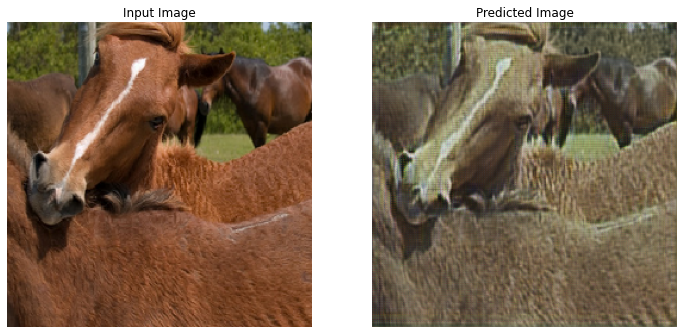

+--------------------------------------------------------------------------+
|                          EPOCH:  01/10 display                           |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 1     | 0:08:31.31 |      1.343 |      1.011 |       0.639 |       0.561 |
+-------+------------+------------+------------+-------------+-------------+


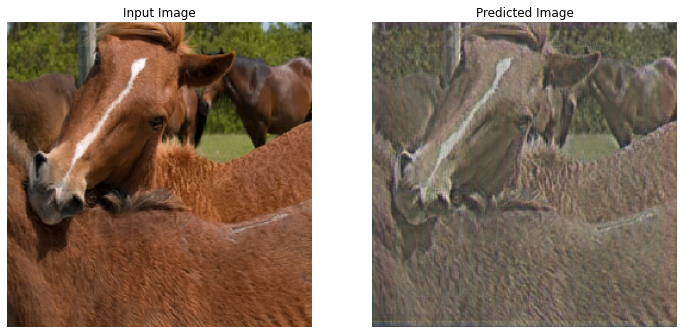

+--------------------------------------------------------------------------+
|                         EPOCH:  02/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 2     | 0:08:17.61 |      1.514 |      1.090 |       0.597 |       0.479 |
+-------+------------+------------+------------+-------------+-------------+
+--------------------------------------------------------------------------+
|                         EPOCH:  03/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 3     | 0:08:17.42 |      1.754 |      1.102 |       0.581 |       0.422 |

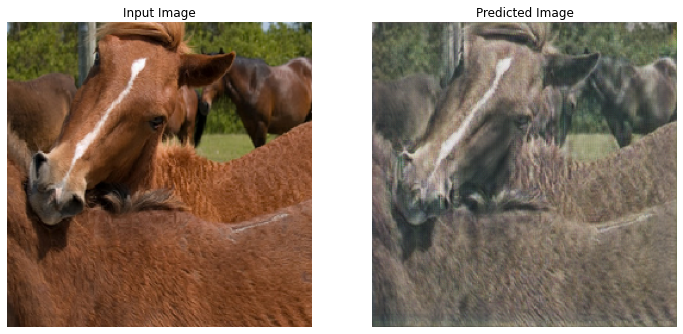

+--------------------------------------------------------------------------+
|                         EPOCH:  04/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 4     | 0:08:16.66 |      1.927 |      1.363 |       0.503 |       0.385 |
+-------+------------+------------+------------+-------------+-------------+
+--------------------------------------------------------------------------+
|                         EPOCH:  05/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 5     | 0:08:17.29 |      1.950 |      1.427 |       0.504 |       0.382 |

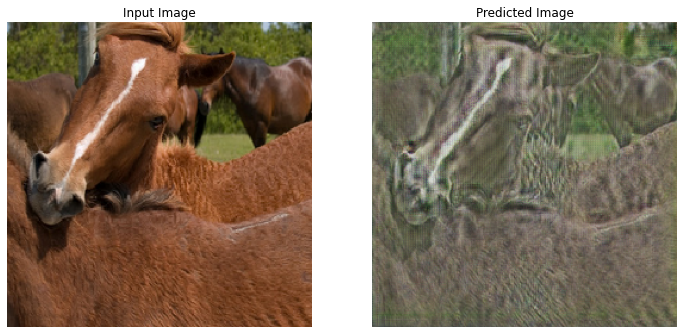

+--------------------------------------------------------------------------+
|                         EPOCH:  06/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 6     | 0:08:17.42 |      2.010 |      1.396 |       0.504 |       0.369 |
+-------+------------+------------+------------+-------------+-------------+
+--------------------------------------------------------------------------+
|                         EPOCH:  07/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 7     | 0:08:17.26 |      2.037 |      1.381 |       0.515 |       0.357 |

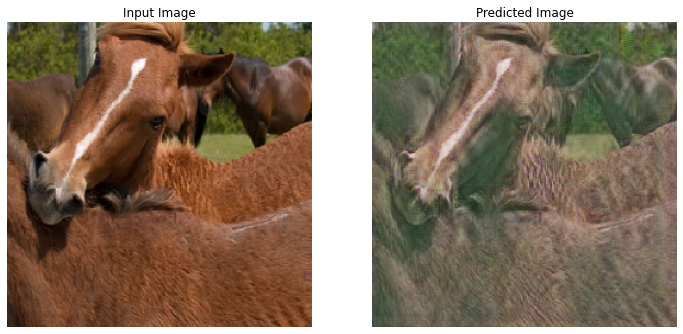

+--------------------------------------------------------------------------+
|                         EPOCH:  08/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 8     | 0:08:17.48 |      2.030 |      1.475 |       0.485 |       0.359 |
+-------+------------+------------+------------+-------------+-------------+
+--------------------------------------------------------------------------+
|                         EPOCH:  09/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 9     | 0:08:17.30 |      2.089 |      1.454 |       0.486 |       0.339 |

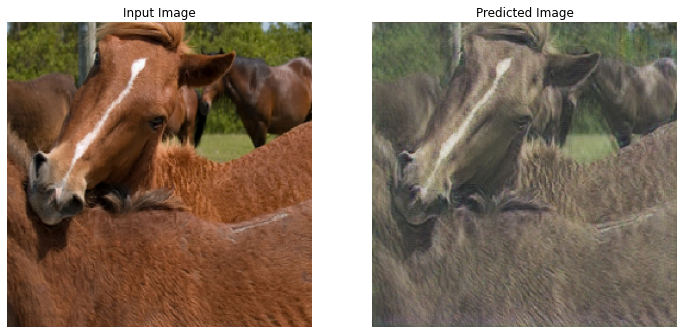

+--------------------------------------------------------------------------+
|                          EPOCH:  10/10 display                           |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 10    | 0:08:17.59 |      2.106 |      1.483 |       0.492 |       0.346 |
+-------+------------+------------+------------+-------------+-------------+


In [45]:
fit(train_horses, train_zebras, EPOCHS)

### Generating images from the train_set

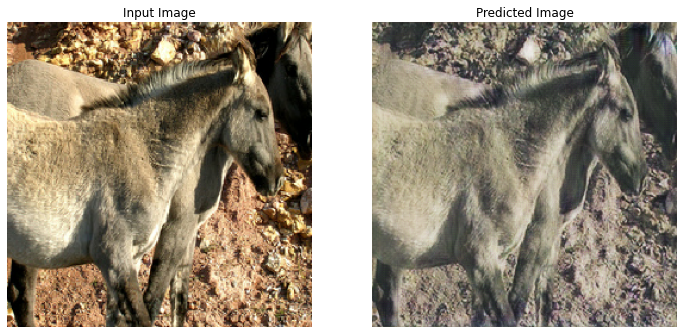

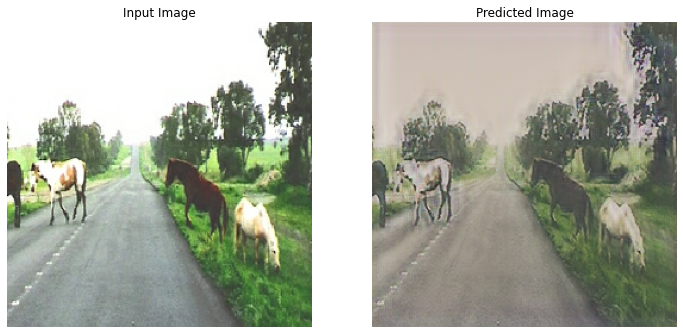

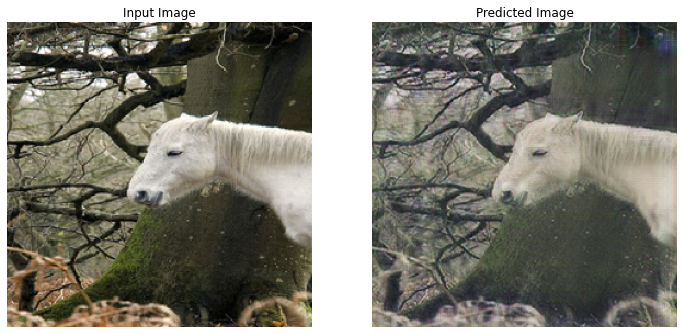

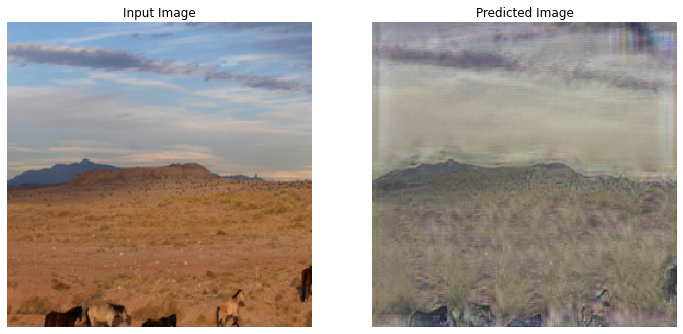

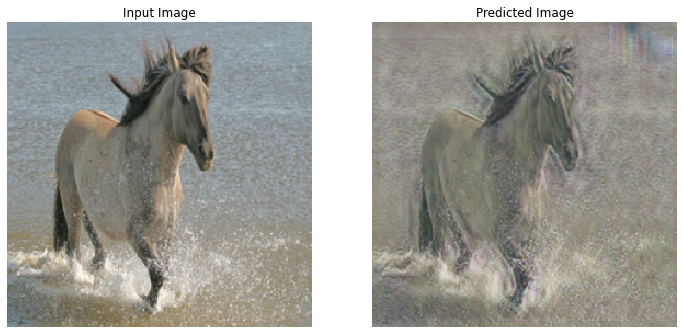

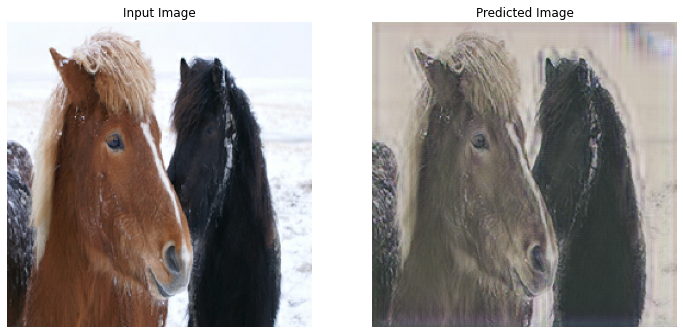

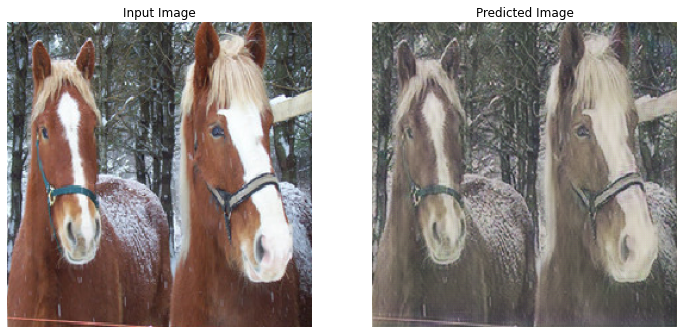

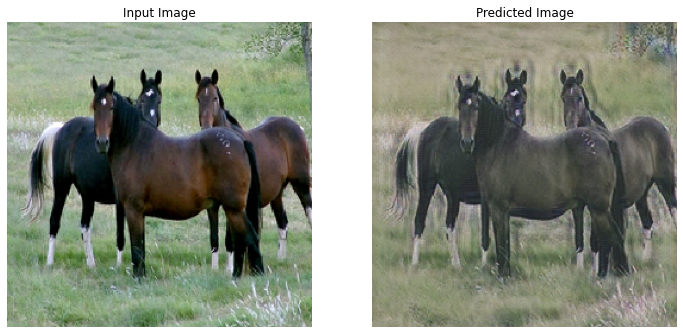

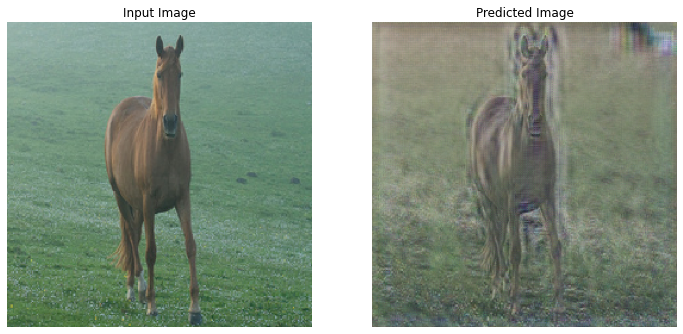

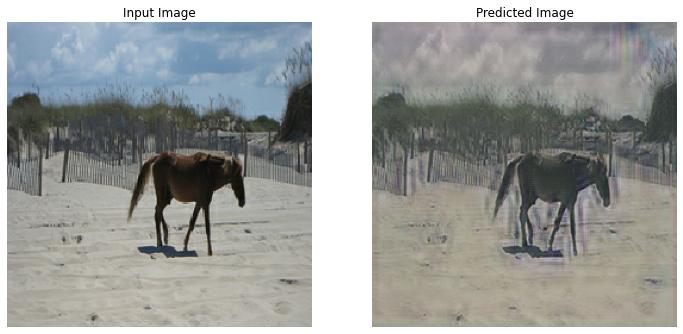

In [46]:
for inp in train_horses.take(10):
  generated_images(generator_g, inp)

### Generating images from the test dataset.

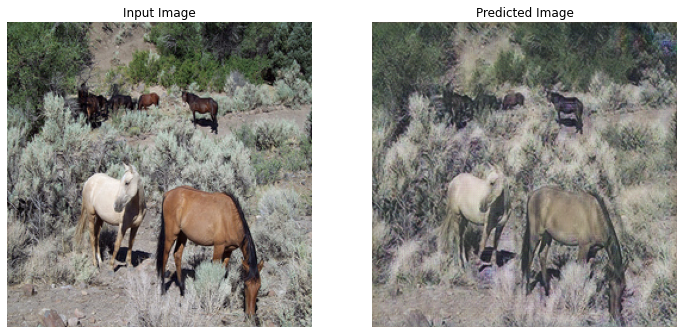

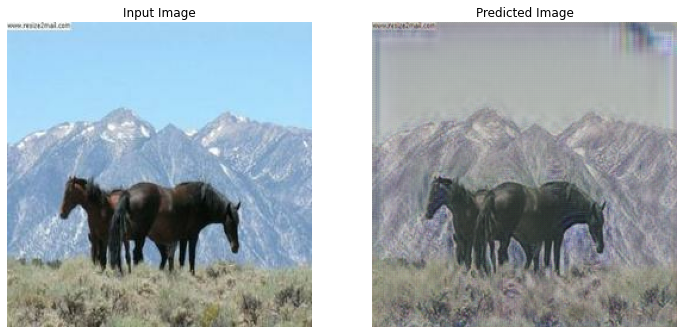

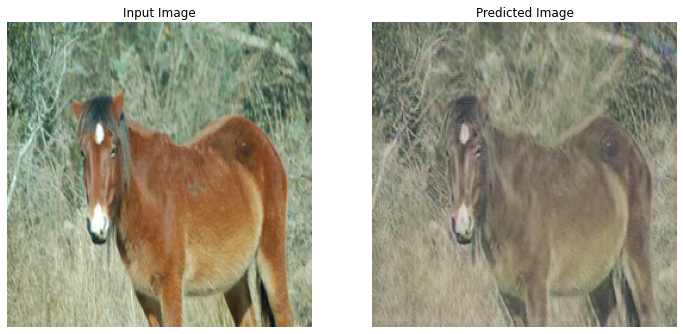

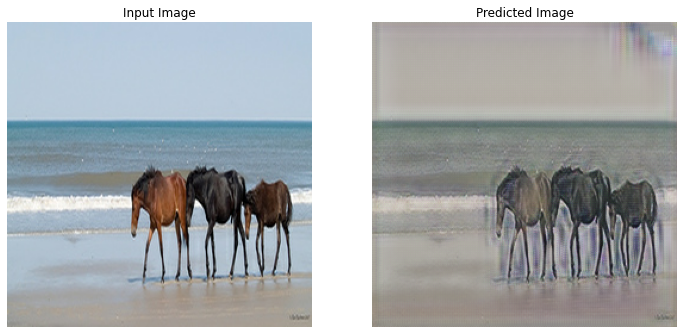

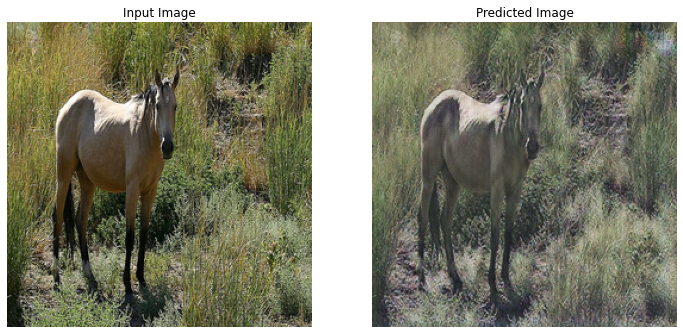

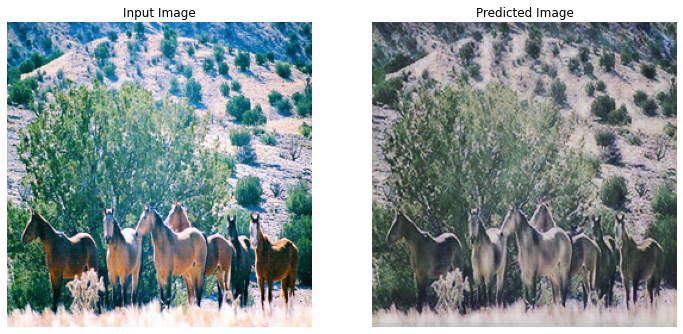

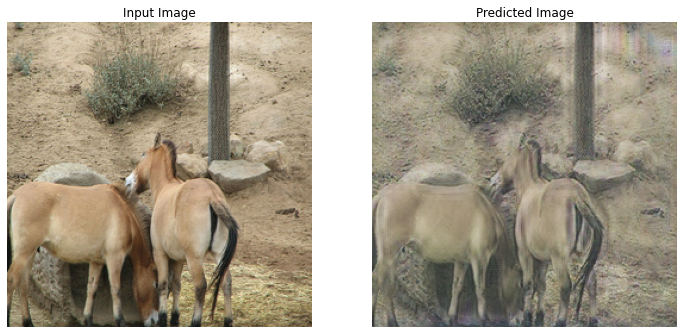

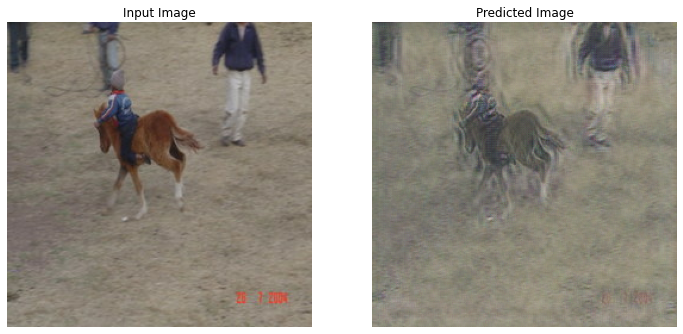

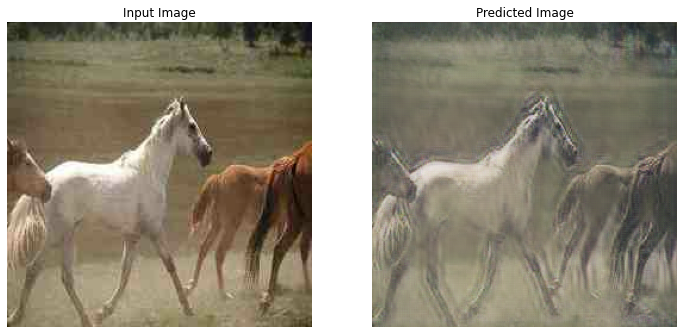

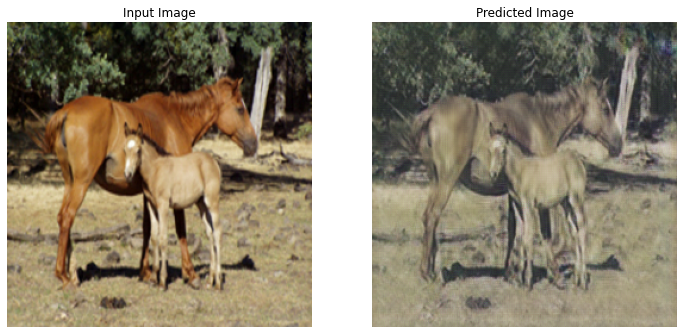

In [47]:
for inp in test_horses.take(10):
  generated_images(generator_g, inp)

### Conclusion
Again the model is not performing what we really want to do. We will come up with some solution but for now the model managed to train


### What's next?

1. We will learn how to load our own images and create a NN that will generates images.

### Resources Used.

* [pix2pix tensorflow](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py)
* [this notebook](https://github.com/CrispenGari/keras-api/blob/main/13_GANs/03_CycleGAN/01_Introduction_From_Tensorflow_Tutorial.ipynb)